<center><h2> Walmart Sales Forecasting </h2></center>

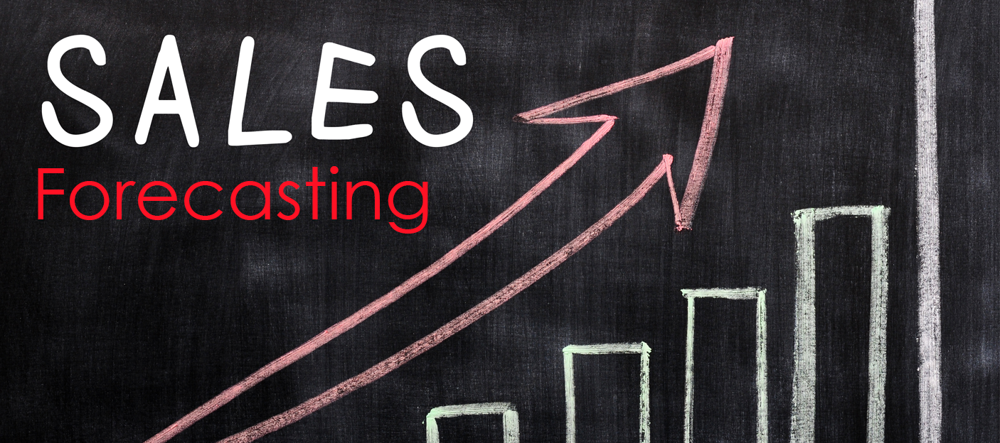

### Business Problem

In this project, students are provided with historical sales data for 45 Walmart stores located in different regions. Each store contains many departments, and participants must project the sales for each department in each store. To add to the challenge, selected holiday markdown events are included in the dataset. These markdowns are known to affect sales, but it is challenging to predict which departments are affected and the extent of the impact.

You may only use the provided data to make your predictions.

### Data

You are provided with historical sales data for 45 Walmart stores located in different regions. Each store contains a number of departments, and you are tasked with predicting the department-wide sales for each store.

In addition, Walmart runs several promotional markdown events throughout the year. These markdowns precede prominent holidays, the four largest of which are the Super Bowl, Labor Day, Thanksgiving, and Christmas. The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks. Part of the challenge presented by this competition is modeling the effects of markdowns on these holiday weeks in the absence of complete/ideal historical data.

The basic idea of analyzing the Walmart Forecasting dataset is to get a fair idea about the factors affecting the Sales of the Walmart Store.

### Problem Statemtent

<b> By using these data we have to Predict the walmart sales forecasting based on different parameters</b>

### Data Description

stores.csv

    This file contains anonymized information about the 45 stores, indicating the type and size of store.

train.csv

    This is the historical training data, which covers to 2010-02-05 to 2012-11-01. Within this file you will find the following fields:

    Store - the store number
    Dept - the department number
    Date - the week
    Weekly_Sales -  sales for the given department in the given store
    IsHoliday - whether the week is a special holiday week
    test.csv

This file is identical to train.csv, except we have withheld the weekly sales. You must predict the sales for each triplet of store, department, and date in this file.

features.csv

    This file contains additional data related to the store, department, and regional activity for the given dates. It contains the following fields:

    Store - the store number
    Date - the week
    Temperature - average temperature in the region
    Fuel_Price - cost of fuel in the region
    MarkDown1-5 - anonymized data related to promotional markdowns that Walmart is running. MarkDown data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA.
    CPI - the consumer price index
    Unemployment - the unemployment rate
    IsHoliday - whether the week is a special holiday week

For convenience, the four holidays fall within the following weeks in the dataset (not all holidays are in the data):

Super Bowl: 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13
Labor Day: 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13
Thanksgiving: 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13
Christmas: 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13

### Business objectives and constraints

1. The cost of a mis-classification can be very high.
2. There is some latency concerns.



```
# This is formatted as code
```

### Importing Libraries

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot

from sklearn.model_selection import train_test_split
from math import sqrt
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import warnings

### Mounting with GDrive

### Reading the Data From the CSV file

In [ ]:
features_df = pd.read_csv(r'C:\Users\bhoom\OneDrive\Desktop\computer sci\data science\Walmart_Sales_Forecasting\Walmart Sales Forecasting\features.csv')
train_df = pd.read_csv(r'C:\Users\bhoom\OneDrive\Desktop\computer sci\data science\Walmart_Sales_Forecasting\Walmart Sales Forecasting\train.csv')
stores_df = pd.read_csv(r'C:\Users\bhoom\OneDrive\Desktop\computer sci\data science\Walmart_Sales_Forecasting\Walmart Sales Forecasting\stores.csv')
test_df = pd.read_csv(r'C:\Users\bhoom\OneDrive\Desktop\computer sci\data science\Walmart_Sales_Forecasting\Walmart Sales Forecasting\test.csv')

In [ ]:
train_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [ ]:
train_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')

In [ ]:
train_df.shape

(421570, 5)

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [ ]:
train_df.describe()

,Store,Dept,Weekly_Sales
count,421570.000000,421570.000000,421570.000000
mean,22.200546,44.260317,15981.258123
std,12.785297,30.492054,22711.183519
min,1.000000,1.000000,-4988.940000
25%,11.000000,18.000000,2079.650000
50%,22.000000,37.000000,7612.030000
75%,33.000000,74.000000,20205.852500
max,45.000000,99.000000,693099.360000


In [ ]:
train_df.isnull()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,False,False,False,False,False
1,False,False,False,False,False
2,False,False,False,False,False
3,False,False,False,False,False
4,False,False,False,False,False
...,...,...,...,...,...
421565,False,False,False,False,False
421566,False,False,False,False,False
421567,False,False,False,False,False
421568,False,False,False,False,False


In [ ]:
train_df.isnull().sum()

Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

In [ ]:
features_df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [ ]:
features_df.columns

Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday'],
      dtype='object')

In [ ]:
features_df.shape

(8190, 12)

In [ ]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB


In [ ]:
features_df.describe()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,8190.000000,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000
mean,23.000000,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821
std,12.987966,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259
min,1.000000,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000
25%,12.000000,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000
50%,23.000000,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000
75%,34.000000,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000
max,45.000000,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000


In [ ]:
features_df.isnull()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,False,False,False,False,True,True,True,True,True,False,False,False
1,False,False,False,False,True,True,True,True,True,False,False,False
2,False,False,False,False,True,True,True,True,True,False,False,False
3,False,False,False,False,True,True,True,True,True,False,False,False
4,False,False,False,False,True,True,True,True,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,False,False,False,False,False,False,False,False,False,True,True,False
8186,False,False,False,False,False,False,False,False,False,True,True,False
8187,False,False,False,False,False,False,False,False,False,True,True,False
8188,False,False,False,False,False,False,False,False,False,True,True,False


In [ ]:
features_df.isnull().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

In [ ]:
stores_df.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [ ]:
stores_df.columns

Index(['Store', 'Type', 'Size'], dtype='object')

In [ ]:
stores_df.shape

(45, 3)

In [ ]:
stores_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


In [ ]:
stores_df.describe()

,Store,Size
count,45.000000,45.000000
mean,23.000000,130287.600000
std,13.133926,63825.271991
min,1.000000,34875.000000
25%,12.000000,70713.000000
50%,23.000000,126512.000000
75%,34.000000,202307.000000
max,45.000000,219622.000000


In [ ]:
stores_df.isnull()

,Store,Type,Size
0,False,False,False
1,False,False,False
2,False,False,False
3,False,False,False
4,False,False,False
5,False,False,False
6,False,False,False
7,False,False,False
8,False,False,False
9,False,False,False


In [ ]:
stores_df.isnull().sum()

Store    0
Type     0
Size     0
dtype: int64

Visualizing the Type of the Stores along with their percentage

In [ ]:
labels = stores_df["Type"].value_counts()[:10].index
values = stores_df["Type"].value_counts()[:10].values

colors=stores_df["Type"]

fig = go.Figure(data=[go.Pie(labels = labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

Type A has the max number of store

Since features and stores have 'Store' as a common column lets merge the data

In [ ]:
# Using the merge function to merge ans we are merging along the common column named Store
dataset = features_df.merge(stores_df, how='inner', on='Store')
dataset.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,A,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,A,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,A,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,A,151315


In [ ]:
stores_df.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [ ]:
# Total number of columns in the dataset
dataset.columns

Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday', 'Type', 'Size'],
      dtype='object')

In [ ]:
# Getting the info
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
 12  Type          8190 non-null   object 
 13  Size          8190 non-null   int64  
dtypes: bool(1), float64(9), int64(2), object(2)
memory usage: 839.9+ KB


since the Date in the above dataset is string value we can convert them into datetime using the datetime

In [ ]:
# Describing the dataset
dataset.describe()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
count,8190.000000,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000,8190.000000
mean,23.000000,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821,130287.600000
std,12.987966,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259,63115.971429
min,1.000000,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000,34875.000000
25%,12.000000,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000,70713.000000
50%,23.000000,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000,126512.000000
75%,34.000000,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000,202307.000000
max,45.000000,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000,219622.000000


Visualizing the Type of the Stores along with their percentage in the dataset

In [ ]:
labels = dataset["Type"].value_counts()[:10].index  # Taking the top 10 index
values = dataset["Type"].value_counts()[:10].values  # Taking the top 10 values

colors=dataset["Type"]

fig = go.Figure(data=[go.Pie(labels = labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

Type A has the maximum number of stores

lets get the datatype info of the test dataset

Here Date is of string type

In [ ]:
# Getting the info
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115064 entries, 0 to 115063
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Store      115064 non-null  int64 
 1   Dept       115064 non-null  int64 
 2   Date       115064 non-null  object
 3   IsHoliday  115064 non-null  bool  
dtypes: bool(1), int64(2), object(1)
memory usage: 2.7+ MB


Here also Date is of string type

Visualizing the top 10 Department in the train dataset along with their percentage

In [ ]:
labels = train_df["Dept"].value_counts()[:10].index  # Taking the top 10 index
values = train_df["Dept"].value_counts()[:10].values  # Taking the top 10 values

colors=train_df["Dept"]

fig = go.Figure(data=[go.Pie(labels = labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

Visualizing the top 10 store in the train dataset along with their percentage

Visualizing the Store Data

In [ ]:
labels = train_df["Store"].value_counts()[:10].index  # Taking the top 10 index
values = train_df["Store"].value_counts()[:10].values  # Taking the top 10 values

colors=train_df["Store"]

fig = go.Figure(data=[go.Pie(labels = labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

Visualizing the IsHoliday Data

In [ ]:
labels = train_df['IsHoliday'].value_counts().index # Taking the all index
values = train_df['IsHoliday'].value_counts().values  # Taking the all values

colors=train_df['IsHoliday']

fig = go.Figure(data=[go.Pie(labels = labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

As per the plot for the 93% of the time there is no Holiday

In [ ]:
# Total number of columns in the test_df
test_df.columns

Index(['Store', 'Dept', 'Date', 'IsHoliday'], dtype='object')

In [ ]:
# To know more about the test_df
test_df.describe()

,Store,Dept
count,115064.000000,115064.000000
mean,22.238207,44.339524
std,12.809930,30.656410
min,1.000000,1.000000
25%,11.000000,18.000000
50%,22.000000,37.000000
75%,33.000000,74.000000
max,45.000000,99.000000


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
dtypes: bool(1), float64(1), int64(2), object(1)
memory usage: 13.3+ MB


In [ ]:
from datetime import datetime
dataset['Date'] = pd.to_datetime(dataset['Date'])
train_df['Date'] = pd.to_datetime(train_df['Date'])
test_df['Date'] = pd.to_datetime(test_df['Date'])

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         8190 non-null   int64         
 1   Date          8190 non-null   datetime64[ns]
 2   Temperature   8190 non-null   float64       
 3   Fuel_Price    8190 non-null   float64       
 4   MarkDown1     4032 non-null   float64       
 5   MarkDown2     2921 non-null   float64       
 6   MarkDown3     3613 non-null   float64       
 7   MarkDown4     3464 non-null   float64       
 8   MarkDown5     4050 non-null   float64       
 9   CPI           7605 non-null   float64       
 10  Unemployment  7605 non-null   float64       
 11  IsHoliday     8190 non-null   bool          
 12  Type          8190 non-null   object        
 13  Size          8190 non-null   int64         
dtypes: bool(1), datetime64[ns](1), float64(9), int64(2), object(1)
memory usage: 839.9+ KB


In [ ]:
# extract ISO week number and year from Date column
dataset['Week'] = dataset['Date'].dt.isocalendar().week.astype(int)  # for the week data
dataset['Year'] = dataset['Date'].dt.year.astype(int)  # for the year data

In [ ]:
dataset.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Type,Size,Week,Year
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,A,151315,5,2010
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,A,151315,6,2010
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,A,151315,7,2010
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,A,151315,8,2010
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,A,151315,9,2010


In [ ]:
# Merging with train_df

train_merge = train_df.merge(dataset, how='inner', on=['Store', 'Date', 'IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [ ]:
# Merging with test_df

test_merge = test_df.merge(dataset, how='inner', on=['Store', 'Date', 'IsHoliday']).sort_values(by=['Store','Dept','Date']).reset_index(drop=True)

In [ ]:
def scatter(train_merge, column):
    plt.figure()
    plt.scatter(train_merge[column] , train_merge['Weekly_Sales'])
    plt.ylabel('Weekly_Sales')
    plt.xlabel(column)

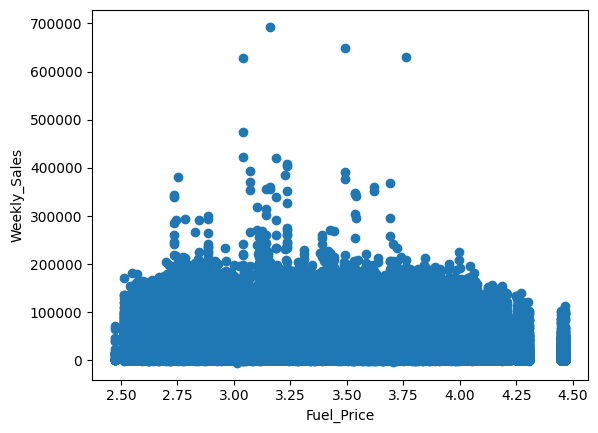

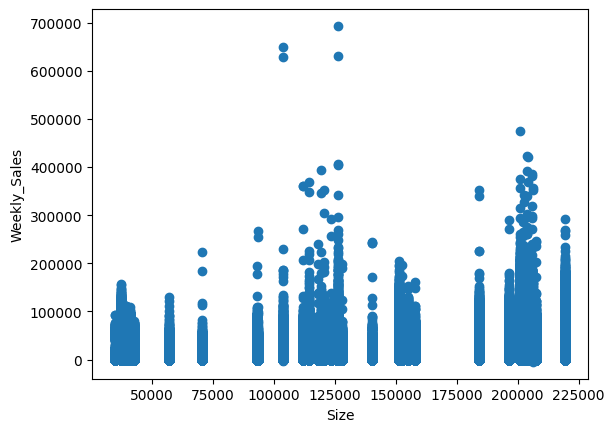

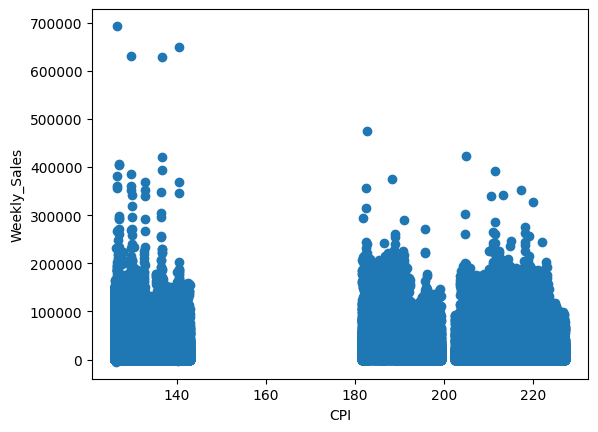

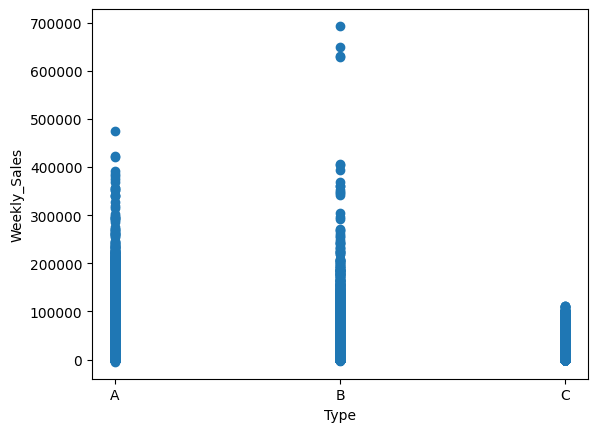

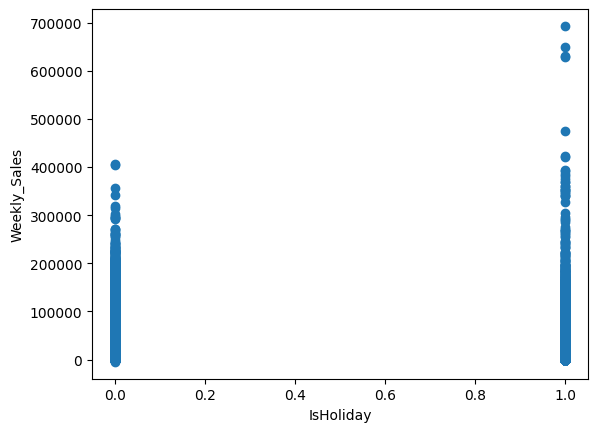

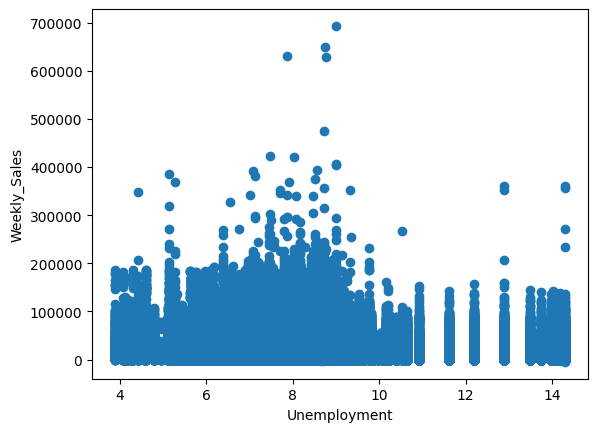

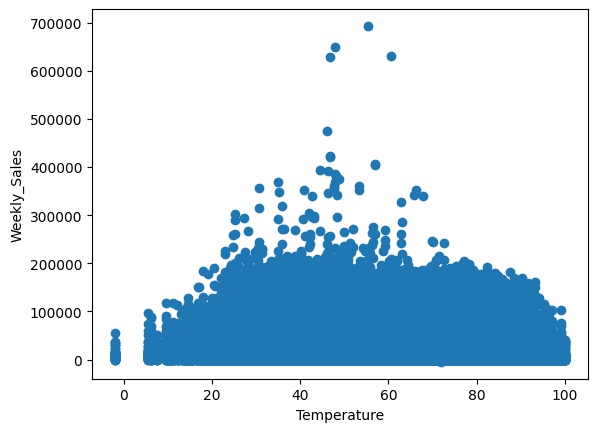

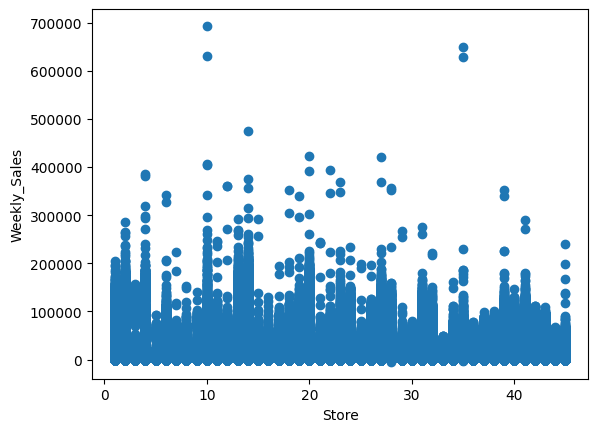

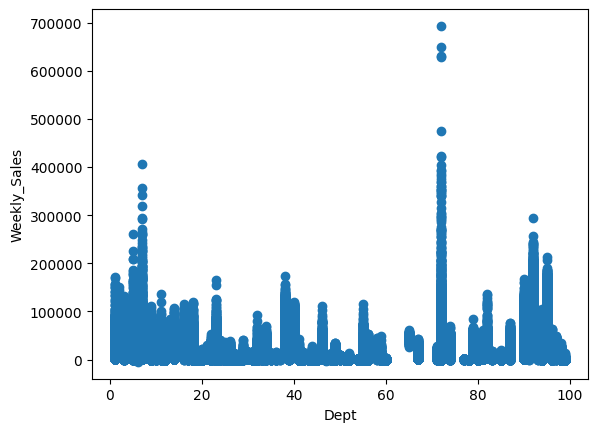

In [ ]:
scatter(train_merge, 'Fuel_Price')  # with respect to Fuel_Price
scatter(train_merge, 'Size')  # with respect to Size
scatter(train_merge, 'CPI')  # with respect to CPI
scatter(train_merge, 'Type')  # with respect to Type
scatter(train_merge, 'IsHoliday') # with respect to IsHoliday
scatter(train_merge, 'Unemployment')  # with respect to Unemployment
scatter(train_merge, 'Temperature') # with respect to Temperature
scatter(train_merge, 'Store') # with respect to Store
scatter(train_merge, 'Dept')  # with respect to Dept

### Correlation Matrix

Let's have a look at the Average Weekly Sales per Year and find out if there is any other holiday peak sales that were not considered by 'IsHoliday' filed

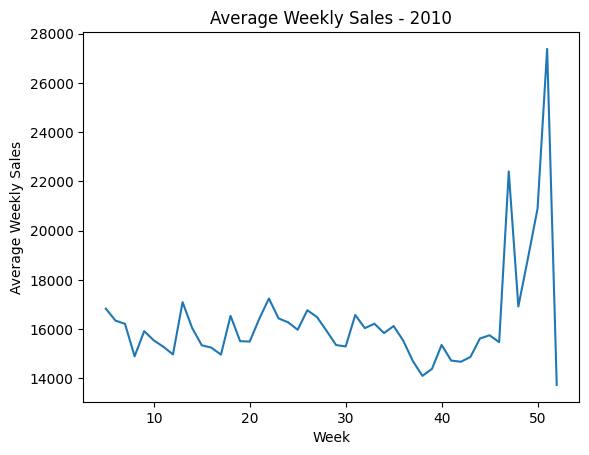

In [ ]:
# Average Weekly Sales for the year 2010
weekly_sales_2010 = train_merge[train_merge['Year']==2010]['Weekly_Sales'].groupby(train_merge['Week']).mean()

# seaborn.lineplot expects x= and y= keyword arguments (or a DataFrame). Provide them explicitly.
sns.lineplot(x=weekly_sales_2010.index, y=weekly_sales_2010.values)
plt.xlabel('Week')
plt.ylabel('Average Weekly Sales')
plt.title('Average Weekly Sales - 2010')
plt.show()

<Axes: xlabel='Week'>

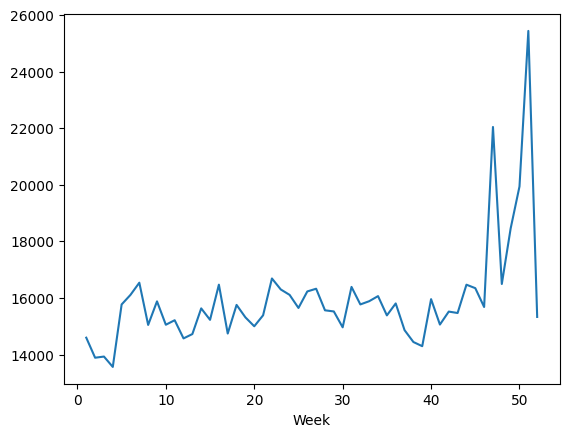

In [ ]:
# Average Weekly Sales for the year 2011
weekly_sales_2011 = train_merge[train_merge['Year']==2011]['Weekly_Sales'].groupby(train_merge['Week']).mean()

sns.lineplot(x=weekly_sales_2011.index, y=weekly_sales_2011.values) # for plotting the lineplot

<Axes: xlabel='Week'>

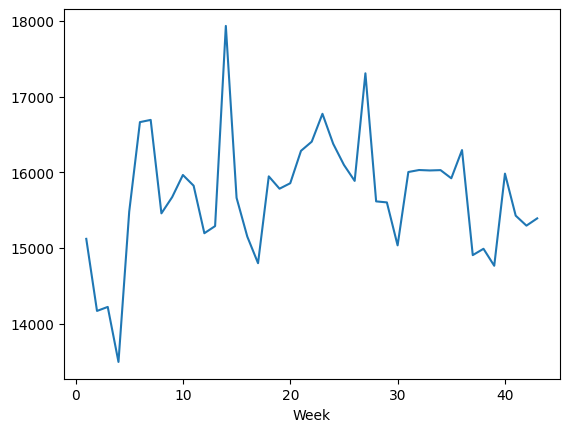

In [ ]:
# Average Weekly Sales for the year 2012
weekly_sales_2012 = train_merge[train_merge['Year']==2012]['Weekly_Sales'].groupby(train_merge['Week']).mean()

sns.lineplot(x=weekly_sales_2012.index, y=weekly_sales_2012.values) # for plotting the lineplot

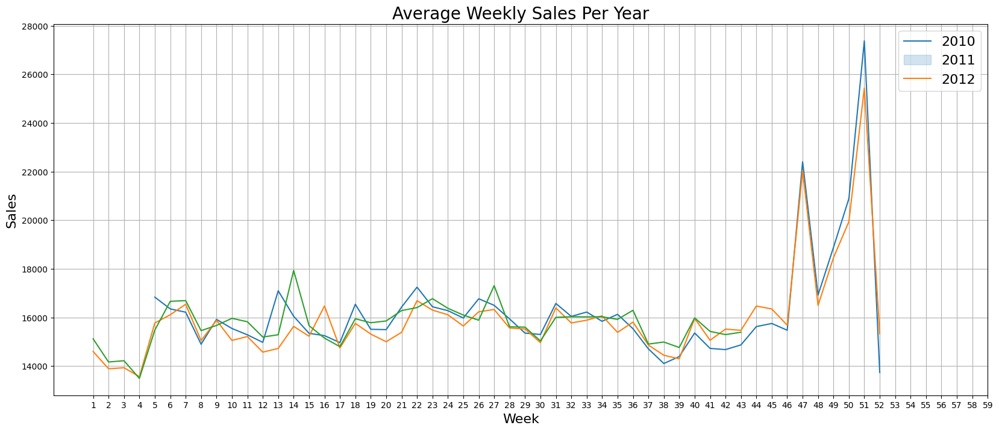

In [ ]:
# Plotting the above three plot together 
plt.figure(figsize=(20,8))
sns.lineplot(x=weekly_sales_2010.index, y=weekly_sales_2010.values)
sns.lineplot(x=weekly_sales_2011.index, y=weekly_sales_2011.values)
sns.lineplot(x=weekly_sales_2012.index, y=weekly_sales_2012.values)
plt.grid()
plt.xticks(np.arange(1,60, step=1))
plt.legend(['2010', '2011', '2012'], loc='best', fontsize=16)
plt.title('Average Weekly Sales Per Year', fontsize=20)
plt.ylabel('Sales', fontsize=16)
plt.xlabel('Week', fontsize=16)
plt.show()

C:\Users\bhoom\AppData\Local\Temp\ipykernel_20720\3455665073.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




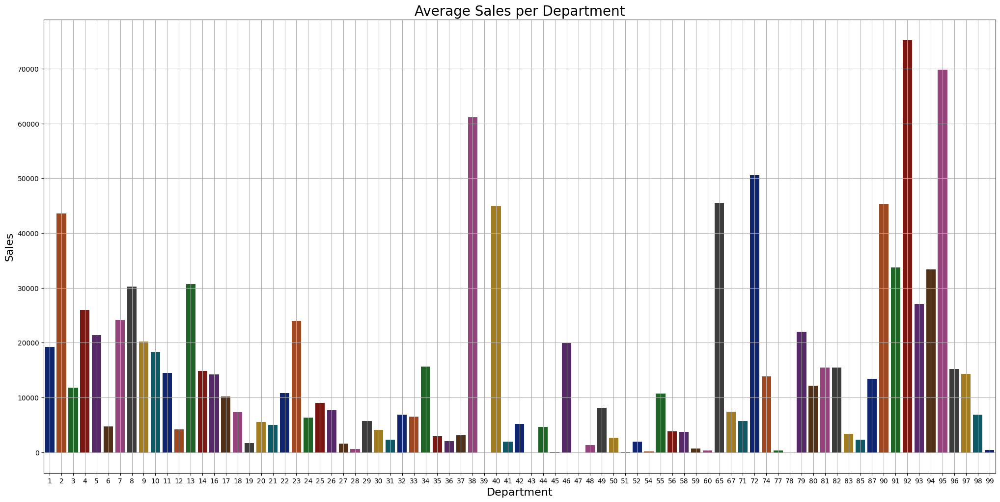

In [ ]:
# Average Sales per Department

weekly_sales = train_merge['Weekly_Sales'].groupby(train_merge['Dept']).mean()
plt.figure(figsize=(25,12))
sns.barplot(x=weekly_sales.index, y=weekly_sales.values, palette='dark')
plt.grid()
plt.title('Average Sales per Department', fontsize=20)
plt.xlabel('Department', fontsize=16)
plt.ylabel('Sales', fontsize=16)
plt.show()

C:\Users\bhoom\AppData\Local\Temp\ipykernel_20720\3373629482.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




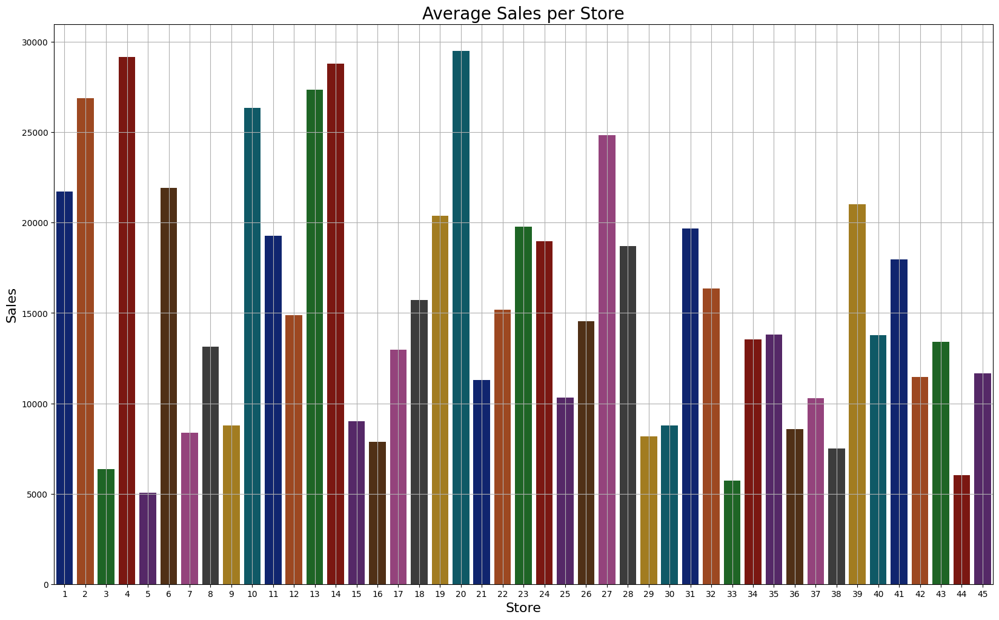

In [ ]:
# Average Sales per Store

weekly_sales = train_merge['Weekly_Sales'].groupby(train_merge['Store']).mean()
plt.figure(figsize=(20,12))
sns.barplot(x=weekly_sales.index, y=weekly_sales.values, palette='dark')
plt.grid()
plt.title('Average Sales per Store', fontsize=20)
plt.xlabel('Store', fontsize=16)
plt.ylabel('Sales', fontsize=16)
plt.show()

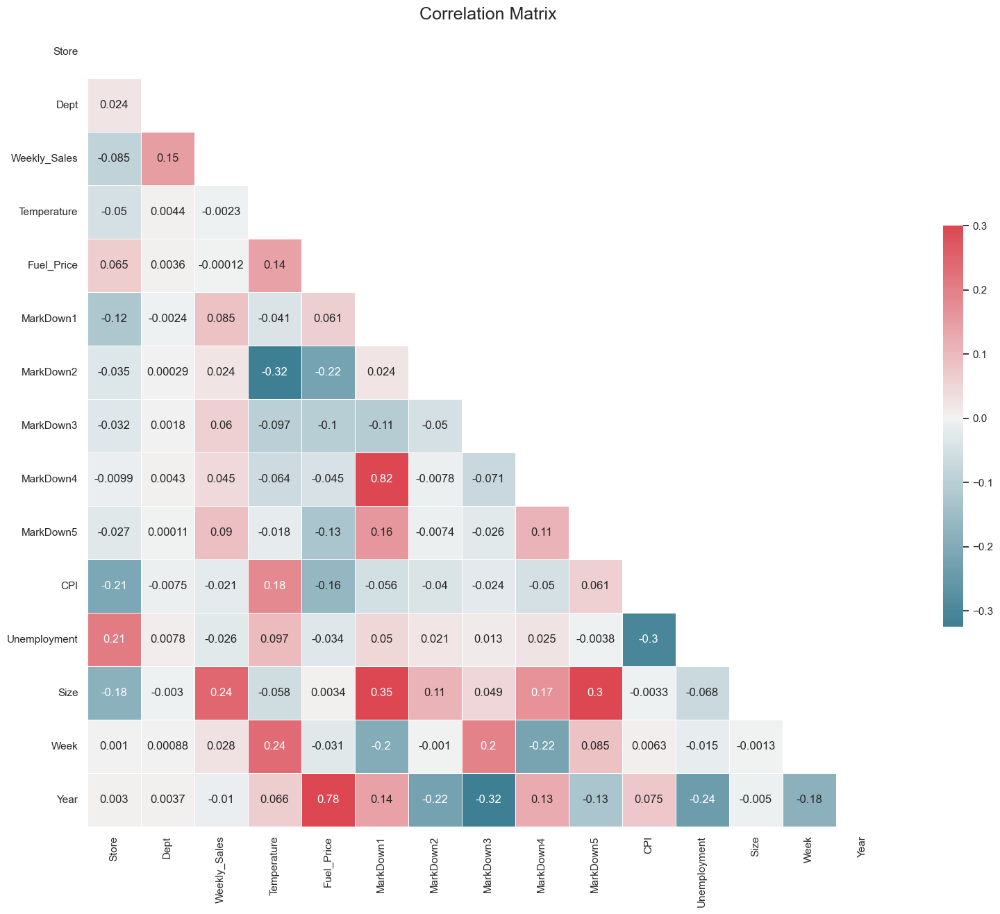

In [ ]:
sns.set(style = "white")

# Select only numeric columns for correlation
numeric_train_merge = train_merge.select_dtypes(include=[np.number])
corr = numeric_train_merge.corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

plt.title('Correlation Matrix', fontsize=18)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show()

In [ ]:
# Dropping down the variables that have weak correlation

train_merge = train_merge.drop(columns=['Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5'])
test_merge = test_merge.drop(columns=['Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5'])

In [ ]:
train_merge.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,CPI,Unemployment,Type,Size,Week,Year
0,1,1,2010-02-05,24924.50,False,42.31,211.096358,8.106,A,151315,5,2010
1,1,1,2010-02-12,46039.49,True,38.51,211.242170,8.106,A,151315,6,2010
2,1,1,2010-02-19,41595.55,False,39.93,211.289143,8.106,A,151315,7,2010
3,1,1,2010-02-26,19403.54,False,46.63,211.319643,8.106,A,151315,8,2010
4,1,1,2010-03-05,21827.90,False,46.50,211.350143,8.106,A,151315,9,2010


In [ ]:
test_merge.head()

,Store,Dept,Date,IsHoliday,Temperature,CPI,Unemployment,Type,Size,Week,Year
0,1,1,2012-11-02,False,55.32,223.462779,6.573,A,151315,44,2012
1,1,1,2012-11-09,False,61.24,223.481307,6.573,A,151315,45,2012
2,1,1,2012-11-16,False,52.92,223.512911,6.573,A,151315,46,2012
3,1,1,2012-11-23,True,56.23,223.561947,6.573,A,151315,47,2012
4,1,1,2012-11-30,False,52.34,223.610984,6.573,A,151315,48,2012


In [ ]:
# Counting the number of unique values
train_df['Dept'].nunique()

81

In [ ]:
# Counting the number of unique values
train_df['Store'].nunique()

45

In [ ]:
# Getting the columns in the train_merge 
train_merge.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'CPI', 'Unemployment', 'Type', 'Size', 'Week', 'Year'],
      dtype='object')

In [ ]:
# Getting the columns in test_merge
test_merge.columns

Index(['Store', 'Dept', 'Date', 'IsHoliday', 'Temperature', 'CPI',
       'Unemployment', 'Type', 'Size', 'Week', 'Year'],
      dtype='object')

### Dividing the data into Train and Test

In [ ]:
X = train_merge[['Store','Dept','IsHoliday','Size','Week','Year']] # Selecting the values to be taken in the X
y = train_merge['Weekly_Sales'] 

# Model Building

In [ ]:
# Splitting the data into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 295099 entries, 338670 to 121958
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype
---  ------     --------------   -----
 0   Store      295099 non-null  int64
 1   Dept       295099 non-null  int64
 2   IsHoliday  295099 non-null  bool 
 3   Size       295099 non-null  int64
 4   Week       295099 non-null  int64
 5   Year       295099 non-null  int64
dtypes: bool(1), int64(5)
memory usage: 13.8 MB


In [ ]:
# Performing GridSearchCV on Ridge Regression
params = {'alpha' : [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]}
ridge_regressor = GridSearchCV(Ridge(), params, cv = 7, scoring = 'neg_mean_absolute_error', n_jobs = -1)
ridge_regressor.fit(X_train, y_train)

,estimator,Ridge()
,param_grid,"{'alpha': [0.0001, 0.001, ...]}"
,scoring,'neg_mean_absolute_error'
,n_jobs,-1
,refit,True
,cv,7
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,10000


In [ ]:
# Predicting train and test results
y_train_pred = ridge_regressor.predict(X_train)
y_test_pred = ridge_regressor.predict(X_test)

In [ ]:
print("Train Results for Ridge Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_train.values, y_train_pred)))
print("R-Squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Ridge Regressor Model:
Root Mean Squared Error:  21696.189989134735
R-Squared:  0.08442134387348965


In [ ]:
print("Test Results for Ridge Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_test.values, y_test_pred)))
print("R-Squared: ", r2_score(y_test.values, y_test_pred))

Test Results for Ridge Regressor Model:
Root Mean Squared Error:  21811.998658223216
R-Squared:  0.0845246410720748


In [ ]:
# Performing GridSearchCV on Lasso Regression
params = {'alpha' : [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000]}
lasso_regressor = GridSearchCV(Lasso(), params ,cv = 15,scoring = 'neg_mean_absolute_error', n_jobs = -1)
lasso_regressor.fit(X_train, y_train)

,estimator,Lasso()
,param_grid,"{'alpha': [0.0001, 0.001, ...]}"
,scoring,'neg_mean_absolute_error'
,n_jobs,-1
,refit,True
,cv,15
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,100000


In [ ]:
# Predicting train and test results
y_train_pred = lasso_regressor.predict(X_train)
y_test_pred = lasso_regressor.predict(X_test)

In [ ]:
print("Train Results for Lasso Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_train.values, y_train_pred)))
print("R-Squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Lasso Regressor Model:
Root Mean Squared Error:  21975.472790897762
R-Squared:  0.06069817884994688


In [ ]:
print("Test Results for Lasso Regressor Model:")
print("Root Mean squared Error: ", sqrt(mse(y_test, y_test_pred)))
print("R-Squared: ", r2_score(y_test, y_test_pred))

Test Results for Lasso Regressor Model:
Root Mean squared Error:  22092.154357868425
R-Squared:  0.06085668250157994


In [81]:
# Predicting train and test results
y_train_pred = tree.predict(X_train)
y_test_pred = tree.predict(X_test)

In [82]:
print("Train Results for Decision Tree Regressor Model:")
print("Root Mean squared Error: ", sqrt(mse(y_train.values, y_train_pred)))
print("R-Squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Decision Tree Regressor Model:
Root Mean squared Error:  1998.502827214475
R-Squared:  0.9922314808009736


In [83]:
print("Test Results for Decision Tree Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_test, y_test_pred)))
print("R-Squared: ", r2_score(y_test, y_test_pred))

Test Results for Decision Tree Regressor Model:
Root Mean Squared Error:  4942.61353488976
R-Squared:  0.952992295626335


In [ ]:
# Performing RandomsearchCV on Random Forest Regression
from sklearn.ensemble import RandomForestRegressor
tuned_params = {'n_estimators': [100, 200], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}  
random_regressor = RandomizedSearchCV(RandomForestRegressor(), tuned_params, n_iter = 3, scoring = 'neg_mean_absolute_error', cv = 3, n_jobs = -1)
random_regressor.fit(X_train, y_train)

,estimator,RandomForestRegressor()
,param_distributions,"{'min_samples_leaf': [1, 2, ...], 'min_samples_split': [2, 5, ...], 'n_estimators': [100, 200]}"
,n_iter,3
,scoring,'neg_mean_absolute_error'
,n_jobs,-1
,refit,True
,cv,3
,verbose,0
,pre_dispatch,'2*n_jobs'
,random_state,None
,error_score,nan


In [85]:
# Predicting train and test results
y_train_pred = random_regressor.predict(X_train)
y_test_pred = random_regressor.predict(X_test)

In [86]:
print("Train Results for Random Forest Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_train.values, y_train_pred)))
print("R-Squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Random Forest Regressor Model:
Root Mean Squared Error:  1943.3047535069252
R-Squared:  0.9926546831326989


In [87]:
print("Test Results for Random Forest Regressor Model:")
print("Root Mean Squared Error: ", sqrt(mse(y_test, y_test_pred)))
print("R-Squared: ", r2_score(y_test, y_test_pred))

Test Results for Random Forest Regressor Model:
Root Mean Squared Error:  3762.76610761891
R-Squared:  0.972756043275586


**Conclusion**
With the above implementation it was possible to forecast the prediction for the Walmart Stores

### Improvements added: time-aware split, lag features, XGBoost and LSTM
The following cells add a time-based train/test split, create lag and rolling features grouped by `Store`+`Dept`, train a baseline XGBoost model, and train a simple LSTM model on sequences of past weekly sales. Run these cells after the previous sections are executed so `train_merge` and `test_merge` are available.

In [89]:
# Install xgboost if not already installed
%pip install xgboost

# Additional imports for improved pipeline
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import math
import numpy as np


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
   ---------------------------------------- 0.3/72.0 MB ? eta -:--:--
   ---------------------------------------- 0.8/72.0 MB 2.2 MB/s eta 0:00:32
    --------------------------------------- 1.3/72.0 MB 2.3 MB/s eta 0:00:31
   - -------------------------------------- 2.1/72.0 MB 2.9 MB/s eta 0:00:25
   - -------------------------------------- 3.1/72.0 MB 3.4 MB/s eta 0:00:21
   -- ------------------------------------- 3.9/72.0 MB 3.5 MB/s eta 0:00:20
   -- ------------------------------------- 4.7/72.0 MB 3.6 MB/s eta 0:00:19
   --- ------------------------------------ 5.8/72.0 MB 3.7 MB/s eta 0:00:19
   --- ------------------------------------ 6.6/72.0 MB 3.7 MB/s eta 0:00:18
   --- ------------------------------------ 7.1/72.0 MB 3.6 MB/s eta 0:00:19
   ---- ----------------------------------- 7.3/72.0 MB 3.5 MB/s eta 0:00:19
   ---- ----------------------------------- 7.9/72.0 MB 3.4 MB/s eta 0:00:19
   ---- -----

In [91]:
# Create lag and rolling features grouped by Store+Dept
full = train_merge.copy()  # train_merge comes from earlier merge in notebook
full = full.sort_values(['Store','Dept','Date']).reset_index(drop=True)
lags = [1,2,3,4]
for lag in lags:
    full[f'lag_{lag}'] = full.groupby(['Store','Dept'])['Weekly_Sales'].shift(lag)
# 4-week rolling mean of previous weeks (compute within each group)
full['rmean_4'] = full.groupby(['Store','Dept'])['Weekly_Sales'].transform(lambda x: x.shift(1).rolling(4).mean())
# Drop rows without lag values (start of series)
full = full.dropna(subset=['lag_1']).reset_index(drop=True)
print('After creating lags, rows available:', full.shape[0])
full.head()

After creating lags, rows available: 418239


,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,CPI,Unemployment,Type,Size,Week,Year,lag_1,lag_2,lag_3,lag_4,rmean_4
0,1,1,2010-02-12,46039.49,True,38.51,211.242170,8.106,A,151315,6,2010,24924.50,NaN,NaN,NaN,NaN
1,1,1,2010-02-19,41595.55,False,39.93,211.289143,8.106,A,151315,7,2010,46039.49,24924.50,NaN,NaN,NaN
2,1,1,2010-02-26,19403.54,False,46.63,211.319643,8.106,A,151315,8,2010,41595.55,46039.49,24924.50,NaN,NaN
3,1,1,2010-03-05,21827.90,False,46.50,211.350143,8.106,A,151315,9,2010,19403.54,41595.55,46039.49,24924.50,32990.77
4,1,1,2010-03-12,21043.39,False,57.79,211.380643,8.106,A,151315,10,2010,21827.90,19403.54,41595.55,46039.49,32216.62


In [92]:
# Time-aware split: use the last 12 weeks as test set (adjust as needed)
max_date = full['Date'].max()
cutoff = max_date - pd.Timedelta(weeks=12)
train_time = full[full.Date <= cutoff].copy()
test_time  = full[full.Date >  cutoff].copy()
print('Train rows:', train_time.shape[0], 'Test rows:', test_time.shape[0])
features = ['Store','Dept','IsHoliday','Size','Week','Year','lag_1','lag_2','lag_3','lag_4','rmean_4']
X_train_time = train_time[features]
y_train_time = train_time['Weekly_Sales']
X_test_time  = test_time[features]
y_test_time  = test_time['Weekly_Sales']
# Simple check
X_train_time.head()

Train rows: 382685 Test rows: 35554


,Store,Dept,IsHoliday,Size,Week,Year,lag_1,lag_2,lag_3,lag_4,rmean_4
0,1,1,True,151315,6,2010,24924.50,NaN,NaN,NaN,NaN
1,1,1,False,151315,7,2010,46039.49,24924.50,NaN,NaN,NaN
2,1,1,False,151315,8,2010,41595.55,46039.49,24924.50,NaN,NaN
3,1,1,False,151315,9,2010,19403.54,41595.55,46039.49,24924.50,32990.77
4,1,1,False,151315,10,2010,21827.90,19403.54,41595.55,46039.49,32216.62


In [93]:
# Train a simple XGBoost regressor on the time-split training data
xgb = XGBRegressor(n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42, verbosity=0)
xgb.fit(X_train_time, y_train_time)
y_pred_xgb = xgb.predict(X_test_time)
rmse_xgb = math.sqrt(mean_squared_error(y_test_time, y_pred_xgb))
mae_xgb = mean_absolute_error(y_test_time, y_pred_xgb)
r2_xgb = r2_score(y_test_time, y_pred_xgb)
print('XGBoost Test RMSE:', round(rmse_xgb,3))
print('XGBoost Test MAE :', round(mae_xgb,3))
print('XGBoost Test R2  :', round(r2_xgb,4))

XGBoost Test RMSE: 2926.457
XGBoost Test MAE : 1317.856
XGBoost Test R2  : 0.9822


In [94]:
# Prepare sequence data for a simple LSTM that uses past 4 weekly sales to predict next week
seq_len = 4
def make_sequences(df, seq_len=4):
    Xs, ys = [], []
    groups = df.groupby(['Store','Dept'])
    for _, g in groups:
        g = g.sort_values('Date')
        vals = g['Weekly_Sales'].values
        if len(vals) <= seq_len:
            continue
        for i in range(seq_len, len(vals)):
            seq_x = vals[i-seq_len:i].reshape(seq_len, 1)
            seq_y = vals[i]
            Xs.append(seq_x)
            ys.append(seq_y)
    return np.array(Xs), np.array(ys)
# Build sequences using the training portion (train_time) and testing portion separately
X_train_seq, y_train_seq = make_sequences(train_time, seq_len=seq_len)
X_test_seq,  y_test_seq  = make_sequences(test_time, seq_len=seq_len)
print('LSTM sequences -> train:', X_train_seq.shape, 'test:', X_test_seq.shape)

LSTM sequences -> train: (369679, 4, 1) test: (23389, 4, 1)


In [95]:
# Define and train a small LSTM model (may take time depending on data size)
if X_train_seq.shape[0] > 0:
    model = Sequential()
    model.add(LSTM(64, input_shape=(X_train_seq.shape[1], X_train_seq.shape[2])))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    history = model.fit(X_train_seq, y_train_seq, epochs=10, batch_size=64, validation_split=0.1, verbose=1)
    # Evaluate on test sequences
    y_pred_lstm = model.predict(X_test_seq).ravel()
    rmse_lstm = math.sqrt(mean_squared_error(y_test_seq, y_pred_lstm))
    mae_lstm  = mean_absolute_error(y_test_seq, y_pred_lstm)
    r2_lstm   = r2_score(y_test_seq, y_pred_lstm)
    print('LSTM Test RMSE:', round(rmse_lstm,3))
    print('LSTM Test MAE :', round(mae_lstm,3))
    print('LSTM Test R2  :', round(r2_lstm,4))
else:
    print('Not enough sequences to train LSTM. Consider using longer history or reduce seq_len.')

c:\Users\bhoom\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 24s 4ms/step - loss: 688375616.0000 - mae: 13635.5957 - val_loss: 211849744.0000 - val_mae: 5852.9072
Epoch 2/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 24s 4ms/step - loss: 688375616.0000 - mae: 13635.5957 - val_loss: 211849744.0000 - val_mae: 5852.9072
Epoch 2/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 344968768.0000 - mae: 7237.2158 - val_loss: 205527184.0000 - val_mae: 5994.5542
Epoch 3/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 344968768.0000 - mae: 7237.2158 - val_loss: 205527184.0000 - val_mae: 5994.5542
Epoch 3/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 350384640.0000 - mae: 7356.4355 - val_loss: 237306384.0000 - val_mae: 6041.3271
Epoch 4/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 350384640.0000 - mae: 7356.4355 - val_loss: 237306384.0000 - val_mae: 6041.3271
Epoch 4/10
5199/5199 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 388715232.0000 - mae: 8059.8984 - val_loss: 232820016.0000 - val_mae: 6409.51

In [97]:
# Train and evaluate classical ML models on the time-aware split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer

models = {}

# Impute missing values (lags / rolling means contain NaNs). Use median to be robust.
imputer = SimpleImputer(strategy='median')
# create imputed train/test copies (preserve column names)
X_train_time_imp = pd.DataFrame(imputer.fit_transform(X_train_time), columns=X_train_time.columns, index=X_train_time.index)
X_test_time_imp  = pd.DataFrame(imputer.transform(X_test_time), columns=X_test_time.columns, index=X_test_time.index)

# Ridge (with simple grid) - scale after imputation
ridge_pipe = Pipeline([('scaler', StandardScaler()), ('ridge', Ridge())])
params_ridge = {'ridge__alpha':[0.01,0.1,1,10]}
ridge_search = GridSearchCV(ridge_pipe, params_ridge, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1)
ridge_search.fit(X_train_time_imp, y_train_time)
models['Ridge'] = ridge_search.best_estimator_

# Lasso
lasso_pipe = Pipeline([('scaler', StandardScaler()), ('lasso', Lasso(max_iter=5000))])
params_lasso = {'lasso__alpha':[0.0001,0.001,0.01,0.1,1]}
lasso_search = GridSearchCV(lasso_pipe, params_lasso, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1)
lasso_search.fit(X_train_time_imp, y_train_time)
models['Lasso'] = lasso_search.best_estimator_

# Decision Tree (shallow) - use imputed data (tree doesn't need scaling)
tree = DecisionTreeRegressor(max_depth=12, random_state=42)
tree.fit(X_train_time_imp, y_train_time)
models['DecisionTree'] = tree

# Random Forest (reasonable defaults) - use imputed data
rf = RandomForestRegressor(n_estimators=200, min_samples_leaf=2, random_state=42, n_jobs=-1)
rf.fit(X_train_time_imp, y_train_time)
models['RandomForest'] = rf

# Evaluate all models and collect metrics (use imputed X_test)
results = []
for name, m in models.items():
    ypred = m.predict(X_test_time_imp)
    rmse = math.sqrt(mean_squared_error(y_test_time, ypred))
    mae  = mean_absolute_error(y_test_time, ypred)
    r2   = r2_score(y_test_time, ypred)
    # avoid division by zero in MAPE
    mape = (np.abs((y_test_time - ypred) / y_test_time.replace(0, np.nan))).mean() * 100
    results.append({'model':name, 'rmse':rmse, 'mae':mae, 'mape_pct':mape, 'r2':r2})
    print(name, '-> RMSE:', round(rmse,3), 'MAE:', round(mae,3), 'R2:', round(r2,4))

import pandas as pd
results_df = pd.DataFrame(results).sort_values('rmse')
results_df

Ridge -> RMSE: 3292.129 MAE: 1601.629 R2: 0.9774
Lasso -> RMSE: 3291.23 MAE: 1600.037 R2: 0.9774
DecisionTree -> RMSE: 3475.797 MAE: 1438.482 R2: 0.9748
RandomForest -> RMSE: 2883.837 MAE: 1297.961 R2: 0.9827
RandomForest -> RMSE: 2883.837 MAE: 1297.961 R2: 0.9827


,model,rmse,mae,mape_pct,r2
3,RandomForest,2883.837173,1297.960548,884.180931,0.982673
1,Lasso,3291.230452,1600.036880,4418.979029,0.977431
0,Ridge,3292.129050,1601.629370,4441.987284,0.977419
2,DecisionTree,3475.797438,1438.482397,694.541953,0.974829


In [100]:
# LightGBM, TimeSeries CV, Stacking Ensemble, SHAP, Test Predictions
# Feature engineering (calendar + target-encoding-like historical mean) and prepare test set for final prediction
# NOTE: Run the notebook top-to-bottom so train_merge, test_merge and earlier created 'full' and time-split variables exist.

# Create calendar features
for df in [full, train_time, test_time, X_train_time, X_test_time]:
    if 'Date' in df.columns:
        df['Month'] = df['Date'].dt.month
        df['Day'] = df['Date'].dt.day
        df['DayOfWeek'] = df['Date'].dt.dayofweek
        df['IsWeekend'] = df['DayOfWeek'].isin([5,6]).astype(int)

# Historical mean per Store-Dept computed only on training history (train_time)
store_dept_mean = train_time.groupby(['Store','Dept'])['Weekly_Sales'].mean().reset_index().rename(columns={'Weekly_Sales':'store_dept_mean'})
train_time = train_time.merge(store_dept_mean, on=['Store','Dept'], how='left')
test_time  = test_time.merge(store_dept_mean, on=['Store','Dept'], how='left')
# fill missing means with global mean
global_mean = train_time['Weekly_Sales'].mean()
train_time['store_dept_mean'] = train_time['store_dept_mean'].fillna(global_mean)
test_time['store_dept_mean']  = test_time['store_dept_mean'].fillna(global_mean)

# Add store_dept_mean into features list (use _x suffix as it appears in the dataframe)
features = ['Store','Dept','IsHoliday','Size','Week','Year','lag_1','lag_2','lag_3','lag_4','rmean_4','Month','DayOfWeek','IsWeekend','store_dept_mean_x']
X_train_time = train_time[features]
y_train_time = train_time['Weekly_Sales']
X_test_time  = test_time[features]
y_test_time  = test_time['Weekly_Sales']


In [102]:
# Install LightGBM and train with TimeSeriesSplit CV (light tuning)
%pip install lightgbm

import lightgbm as lgb
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV

param_dist = {
    'num_leaves': [31, 50, 100],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500],
    'min_child_samples': [5, 10, 20]
}

ts = TimeSeriesSplit(n_splits=3)
# Use RandomizedSearchCV with TimeSeriesSplit
lgbm = lgb.LGBMRegressor(random_state=42)
lgb_search = RandomizedSearchCV(lgbm, param_dist, n_iter=12, cv=ts, scoring='neg_mean_absolute_error', n_jobs=-1, random_state=42)

print('Starting LightGBM randomized search (time-series CV)...')
lgb_search.fit(X_train_time, y_train_time)
print('Best params:', lgb_search.best_params_)

best_lgb = lgb_search.best_estimator_
y_pred_lgb = best_lgb.predict(X_test_time)
rmse_lgb = math.sqrt(mean_squared_error(y_test_time, y_pred_lgb))
mae_lgb = mean_absolute_error(y_test_time, y_pred_lgb)
r2_lgb = r2_score(y_test_time, y_pred_lgb)
print('LightGBM Test RMSE:', round(rmse_lgb,3))
print('LightGBM Test MAE :', round(mae_lgb,3))
print('LightGBM Test R2  :', round(r2_lgb,4))


   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ------- -------------------------------- 0.3/1.5 MB ? eta -:--:--
   -------------- ------------------------- 0.5/1.5 MB 885.6 kB/s eta 0:00:02
   --------------------- ------------------ 0.8/1.5 MB 1.0 MB/s eta 0:00:01
   ---------------------------- ----------- 1.0/1.5 MB 1.1 MB/s eta 0:00:01
   ------------------------------------ --- 1.3/1.5 MB 1.2 MB/s eta 0:00:01
   ---------------------------------------- 1.5/1.5 MB 1.2 MB/s  0:00:01
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Starting LightGBM randomized search (time-series CV)...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1770
[LightGBM] [Info] Number of data points in the train set: 382685, number of used features: 13
[LightGBM] [Info] Start training from score 16026.362889
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1770
[LightGBM] [Info] Number of data points in the train set: 382685, number of used features: 13
[LightGBM] [Info] Start training from score 16026.362889
Best params: {'num_leaves': 50, 'n_estimators': 500, 'min_child_samples': 10, 'learning_rate': 0.1}
Best params: {'num_lea

In [106]:
# Build a stacking ensemble: XGBoost, LightGBM, RandomForest -> meta learner (Ridge)
from sklearn.ensemble import StackingRegressor

# Ensure train and test use the exact same feature names / order and that any NaNs are imputed.
# Create a fresh imputer fit on the current X_train_time feature set (this avoids mismatched feature stats)
imputer = SimpleImputer(strategy='median')
X_train_time_imp = pd.DataFrame(imputer.fit_transform(X_train_time), columns=X_train_time.columns, index=X_train_time.index)
X_test_time_imp  = pd.DataFrame(imputer.transform(X_test_time),  columns=X_test_time.columns,  index=X_test_time.index)

# Re-fit base learners on the imputed, consistent feature matrix so they expect the same feature names
print('Fitting base learners on imputed, time-split training set...')
xgb.fit(X_train_time_imp, y_train_time)
best_lgb.fit(X_train_time_imp, y_train_time)
rf.fit(X_train_time_imp, y_train_time)

# Build and train stacking regressor
estimators = [
    ('xgb', xgb),
    ('lgb', best_lgb),
    ('rf', rf)
]
stack = StackingRegressor(estimators=estimators, final_estimator=Ridge(), n_jobs=-1)
print('Training stacking regressor on imputed time-split training set...')
stack.fit(X_train_time_imp, y_train_time)

# Predict on the imputed test set
y_pred_xgb   = xgb.predict(X_test_time_imp)
y_pred_lgb   = best_lgb.predict(X_test_time_imp)
y_pred_rf    = rf.predict(X_test_time_imp)
y_pred_stack = stack.predict(X_test_time_imp)

rmse_stack = math.sqrt(mean_squared_error(y_test_time, y_pred_stack))
mae_stack  = mean_absolute_error(y_test_time, y_pred_stack)
r2_stack   = r2_score(y_test_time, y_pred_stack)
print('Stack Test RMSE:', round(rmse_stack,3))
print('Stack Test MAE :', round(mae_stack,3))
print('Stack Test R2  :', round(r2_stack,4))

# Compare stack vs individual models (use predictions computed on X_test_time_imp)
results_stack = {
    'model':['XGBoost','LightGBM','RandomForest','Stacking'],
    'rmse':[
        math.sqrt(mean_squared_error(y_test_time, y_pred_xgb)),
        math.sqrt(mean_squared_error(y_test_time, y_pred_lgb)),
        math.sqrt(mean_squared_error(y_test_time, y_pred_rf)),
        rmse_stack
    ],
    'mae':[
        mean_absolute_error(y_test_time, y_pred_xgb),
        mean_absolute_error(y_test_time, y_pred_lgb),
        mean_absolute_error(y_test_time, y_pred_rf),
        mae_stack
    ],
    'r2':[
        r2_score(y_test_time, y_pred_xgb),
        r2_score(y_test_time, y_pred_lgb),
        r2_score(y_test_time, y_pred_rf),
        r2_stack
    ]
}

pd.DataFrame(results_stack)


Fitting base learners on imputed, time-split training set...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1770
[LightGBM] [Info] Number of data points in the train set: 382685, number of used features: 13
[LightGBM] [Info] Start training from score 16026.362889
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004585 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1770
[LightGBM] [Info] Number of data points in the train set: 382685, number of used features: 13
[LightGBM] [Info] Start training from score 16026.362889
Training stacking regressor on imputed time-split training set...
Training stacking regressor on imputed time-split t

,model,rmse,mae,r2
0,XGBoost,2740.272403,1300.847279,0.984355
1,LightGBM,2660.894665,1243.820290,0.985248
2,RandomForest,2718.425813,1270.036818,0.984603
3,Stacking,2650.045695,1241.677066,0.985368


In [ ]:
import numpy as np
import pandas as pd

print('Simple Rolling Prediction: Next Week = Last Week Sales')

# Step 0: Load data (adjust file paths if needed)
print('\nLoading data...')
train = pd.read_csv('train.csv', parse_dates=['Date'])
test = pd.read_csv('test.csv', parse_dates=['Date'])
features = pd.read_csv('features.csv', parse_dates=['Date'])
stores = pd.read_csv('stores.csv')
print(f' Data loaded: train={train.shape}, test={test.shape}')

# Step 1: Create train_merge
print('\nCreating train_merge...')
train_merge = train.merge(features, on=['Store', 'Date'], how='left')
train_merge = train_merge.merge(stores, on='Store', how='left')
print(f' train_merge ready: {train_merge.shape}')

# Step 2: Get last week's sales for each Store-Dept
print('\nGetting last week sales...')
last_sales = (train_merge
    .sort_values(['Store', 'Dept', 'Date'])
    .groupby(['Store', 'Dept'])['Weekly_Sales']
    .last()
    .reset_index()
    .rename(columns={'Weekly_Sales': 'Last_Week_Sales'})
)
print(f' Last sales for {len(last_sales)} Store-Dept combinations')

# Step 3: Merge with test and predict
print('\nGenerating predictions...')
test_pred = test.merge(last_sales, on=['Store', 'Dept'], how='left')
global_avg = train_merge['Weekly_Sales'].mean()
test_pred['Weekly_Sales_Pred'] = test_pred['Last_Week_Sales'].fillna(global_avg)

# Step 4: Save
submission = test_pred[['Store', 'Dept', 'Date', 'Weekly_Sales_Pred']]
submission.to_csv('submission_predictions.csv', index=False)

print(f' SUCCESS! Saved {len(submission):,} predictions')
print(f'\nStats:')
print(f'  Mean: ${submission["Weekly_Sales_Pred"].mean():,.2f}')
print(f'  Min : ${submission["Weekly_Sales_Pred"].min():,.2f}')
print(f'  Max : ${submission["Weekly_Sales_Pred"].max():,.2f}')
print(f'\nFirst 10 predictions:')
print(submission.head(10))

Simple Rolling Prediction: Next Week = Last Week Sales

Loading data...
 Data loaded: train=(421570, 5), test=(115064, 4)

Creating train_merge...
 train_merge ready: (421570, 17)

Getting last week sales...
 Last sales for 3331 Store-Dept combinations

Generating predictions...

✓ SUCCESS! Saved 115,064 predictions

Stats:
  Mean: $15,408.23
  Min : $-400.00
  Max : $183,483.92

First 10 predictions:
   Store  Dept       Date  Weekly_Sales_Pred
0      1     1 2012-11-02           27390.81
1      1     1 2012-11-09           27390.81
2      1     1 2012-11-16           27390.81
3      1     1 2012-11-23           27390.81
4      1     1 2012-11-30           27390.81
5      1     1 2012-12-07           27390.81
6      1     1 2012-12-14           27390.81
7      1     1 2012-12-21           27390.81
8      1     1 2012-12-28           27390.81
9      1     1 2013-01-04           27390.81
